In [104]:
import xarray as xr
import matplotlib.pyplot as plt

from matplotlib.colors import LogNorm
from matplotlib.colors import LightSource

In [107]:
inputs = xr.open_dataset("/Users/jonniebarnsley/data/inversion_inputs.nc")
#inputs = inputs.coarsen(x=2, y=2, boundary="trim").mean()
obs = inputs.umod
thk = inputs.thk

misfit2d = {}
var2d = {}

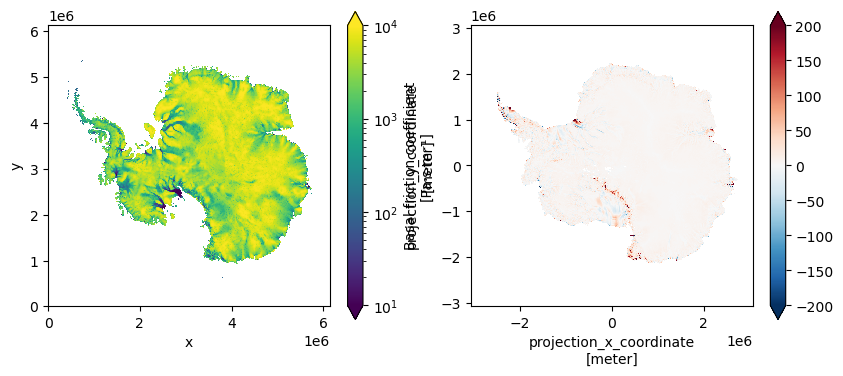

In [108]:
file2 = xr.open_dataset("/Users/jonniebarnsley/Downloads/init2/init.run02.nc")
C = file2.Cwshelf
thk = file2.thickness
zb = file2.Z_base
grounded = thk > -zb * (1027/917)
C = C.where(grounded)
#C = C.where(C != 100)

fig, ax = plt.subplots(ncols=2, figsize=(10, 4))

C = C.coarsen(x=8, y=8, boundary="trim").mean()
C.plot(ax=ax[0], norm = LogNorm(vmin=10, vmax=1e4)) #norm = LogNorm(vmin=1, vmax=1e4)
var2d["loC"] = C

u, v = file2.xVelb, file2.yVelb
speed = (u**2 + v**2)**0.5
speed = speed.where(speed > 0)

x = speed.x
y = speed.y

xs = x - x.mean()
ys = y - y.mean()

speed = speed.assign_coords({"x": xs, "y": ys})
speed = speed.interp(x=obs.x, y=obs.y, method="linear")

obs = obs.assign_coords({"x": speed.x, "y": speed.y})
mask = speed.notnull() & (obs > 0)
obs = obs.where(mask)
speed = speed.where(mask)

misfit = (speed - obs)

misfit = misfit.coarsen(x=8, y=8, boundary="trim").mean()
misfit.plot(ax=ax[1], vmax=200)
misfit2d["loC"] = misfit

for x in ax:
    x.set_aspect('equal')

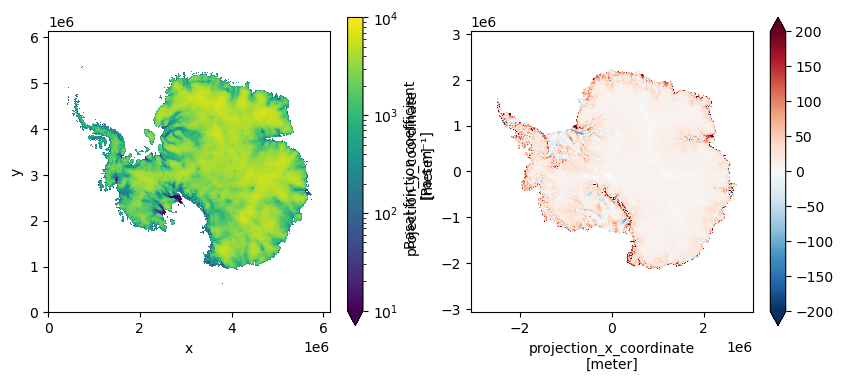

In [109]:
from scipy.ndimage import gaussian_filter

file3 = xr.open_dataset("/Users/jonniebarnsley/Downloads/init2/init.run03.nc")
C = file3.Cwshelf
# C = C.where(C > 0, other=10)
# C = C.where(C != 100, other=10)

thk = file2.thickness
zb = file2.Z_base
grounded = thk > -zb * (1027/917)
C = C.where(grounded)

fig, ax = plt.subplots(ncols=2, figsize=(10, 4))

C = C.coarsen(x=8, y=8, boundary="trim").mean()
C.plot(ax=ax[0], norm = LogNorm(vmin=10, vmax=1e4)) #norm = LogNorm(vmin=1, vmax=1e4)
var2d["hiC"] = C

u, v = file3.xVelb, file3.yVelb
speed = (u**2 + v**2)**0.5
speed = speed.where(speed > 0)

x = speed.x
y = speed.y

xs = x - x.mean()
ys = y - y.mean()

speed = speed.assign_coords({"x": xs, "y": ys})
speed = speed.interp(x=obs.x, y=obs.y, method="linear")

obs = obs.assign_coords({"x": speed.x, "y": speed.y})
mask = speed.notnull() & (obs > 0)
obs = obs.where(mask)
speed = speed.where(mask)

misfit = (speed - obs)
misfit = misfit.where(inputs.umodc == 1)

misfit = misfit.coarsen(x=8, y=8, boundary="trim").mean()
misfit.plot(ax=ax[1], vmax=200)
misfit2d["hiC"] = misfit

for x in ax:
    x.set_aspect('equal')

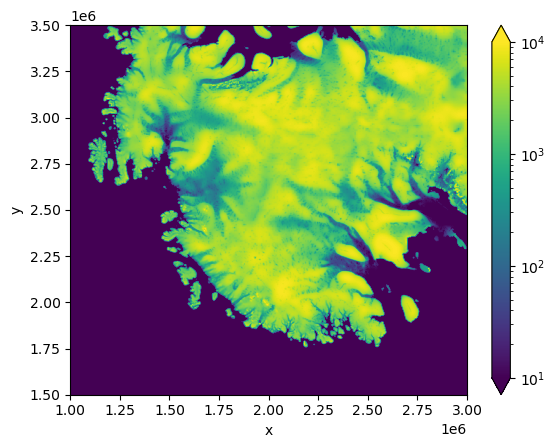

In [110]:
from scipy.ndimage import gaussian_filter

def crop_to_wais(da):
    x = da.x
    y = da.y
    da = da.where((x > 1e6) & (x < 3e6) & (y > 1.5e6) & (y < 3.5e6), drop=True)
    smooth = gaussian_filter(da, sigma=2)
    return xr.DataArray(smooth, coords=da.coords, dims=da.dims)

C = file2.Cwshelf
C = C.where(C > 0, other=10)
C = C.where(C != 100, other=10)


wais1 = crop_to_wais(C)
wais1.plot(norm = LogNorm(vmin=10, vmax=1e4))

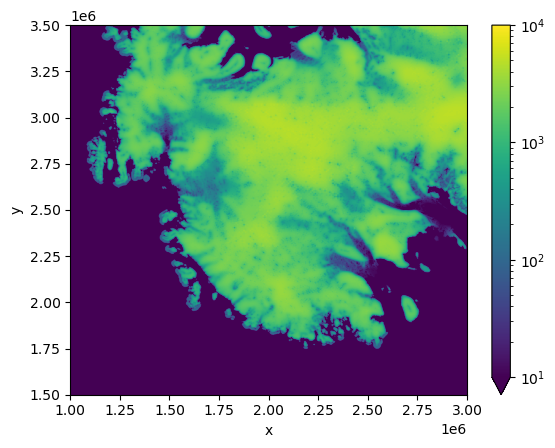

In [111]:
C = file3.Cwshelf
C = C.where(C > 0, other=10)
C = C.where(C != 100, other=10)

wais2 = crop_to_wais(C)
wais2.plot(norm = LogNorm(vmin=10, vmax=1e4))

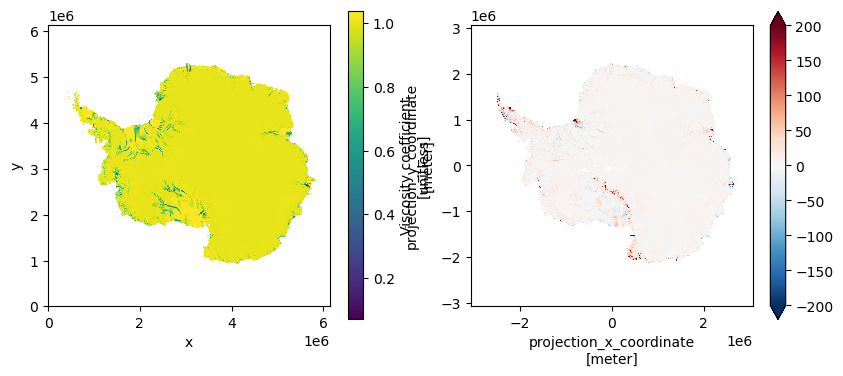

In [112]:
file2 = xr.open_dataset("/Users/jonniebarnsley/Downloads/init2/init.run04.nc")
phi = file2.muCoef

fig, ax = plt.subplots(ncols=2, figsize=(10, 4))

phi = phi.where(file2.thickness > 0)
phi = phi.coarsen(x=8, y=8, boundary="trim").mean()
phi.plot(ax=ax[0]) #norm = LogNorm(vmin=1, vmax=1e4)
var2d["loPhi"] = phi

u, v = file2.xVelb, file2.yVelb
speed = (u**2 + v**2)**0.5
speed = speed.where(speed > 0)

x = speed.x
y = speed.y

xs = x - x.mean()
ys = y - y.mean()

speed = speed.assign_coords({"x": xs, "y": ys})
speed = speed.interp(x=obs.x, y=obs.y, method="linear")

obs = obs.assign_coords({"x": speed.x, "y": speed.y})
mask = speed.notnull() & (obs > 0)
obs = obs.where(mask)
speed = speed.where(mask)

misfit = (speed - obs)

misfit = misfit.coarsen(x=8, y=8, boundary="trim").mean()
misfit.plot(ax=ax[1], vmax=200)
misfit2d["loPhi"] = misfit

for x in ax:
    x.set_aspect('equal')

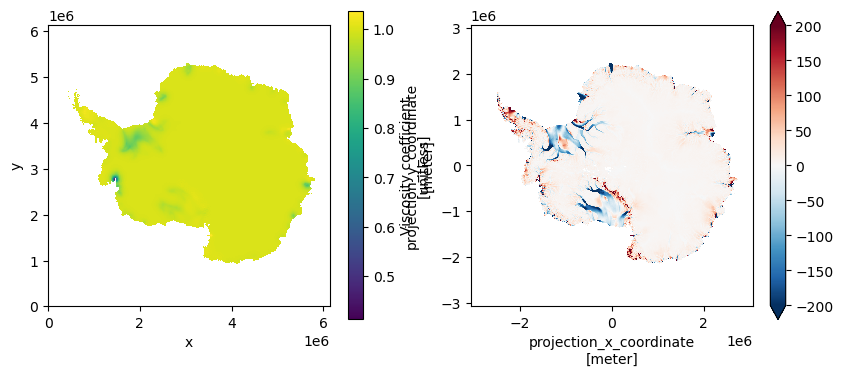

In [113]:
file2 = xr.open_dataset("/Users/jonniebarnsley/Downloads/init2/init.run05.nc")
phi = file2.muCoef

fig, ax = plt.subplots(ncols=2, figsize=(10, 4))

phi = phi.where(file2.thickness > 0)
phi = phi.coarsen(x=8, y=8, boundary="trim").mean()
phi.plot(ax=ax[0]) #norm = LogNorm(vmin=1, vmax=1e4)
var2d["hiPhi"] = phi

u, v = file2.xVelb, file2.yVelb
speed = (u**2 + v**2)**0.5
speed = speed.where(speed > 0)

x = speed.x
y = speed.y

xs = x - x.mean()
ys = y - y.mean()

speed = speed.assign_coords({"x": xs, "y": ys})
speed = speed.interp(x=obs.x, y=obs.y, method="linear")

obs = obs.assign_coords({"x": speed.x, "y": speed.y})
mask = speed.notnull() & (obs > 0)
obs = obs.where(mask)
speed = speed.where(mask)

misfit = (speed - obs)

misfit = misfit.coarsen(x=8, y=8, boundary="trim").mean()
misfit.plot(ax=ax[1], vmax=200)
misfit2d["hiPhi"] = misfit

for x in ax:
    x.set_aspect('equal')

In [114]:
ls = LightSource(azdeg=315, altdeg=45)  # sun direction and angle
topg = inputs.topg.coarsen(x=10, y=10, boundary="trim").mean()  # coarsen for speed
# rgb blend of colormap + hillshade
rgb = ls.shade(topg.values, cmap=plt.get_cmap('Greys_r'), 
               vert_exag=0.005, blend_mode='soft')

rgb_da = xr.DataArray(
    rgb,
    dims=(*topg.dims, 'rgba'),
    coords={topg.dims[0]: topg[topg.dims[0]],
            topg.dims[1]: topg[topg.dims[1]]},
)

#rgb_da.plot.imshow(ax=ax, x='x', y='y', alpha=0.5, rasterized=True)

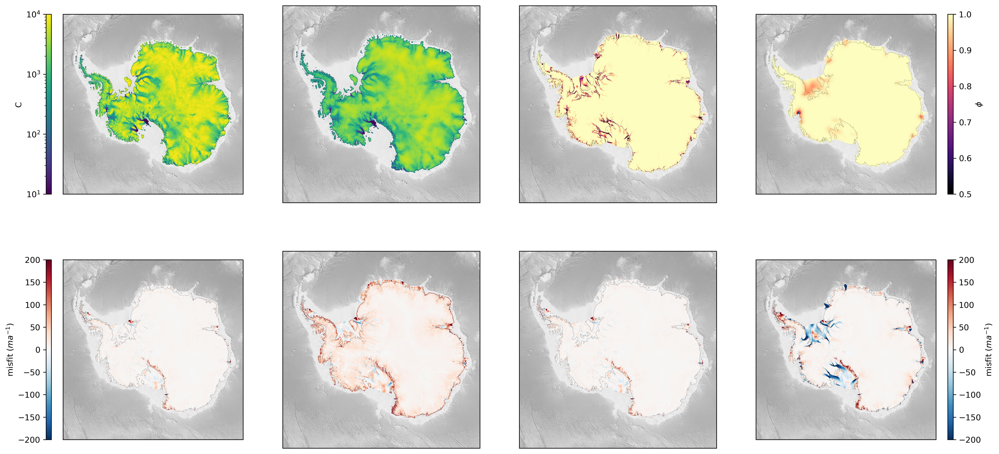

In [115]:
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib as mpl

kw = dict(central_latitude=-90, central_longitude=0, true_scale_latitude=-70)
proj = ccrs.Stereographic(**kw)

fig, axes = plt.subplots(ncols=4, nrows=2, figsize=(20, 10), subplot_kw={"projection": proj}, dpi=300)
axes = axes.flatten()

for ax in axes:
    rgb_da.plot.imshow(ax=ax, x='x', y='y', alpha=0.5, rasterized=True)

for ax, name in zip(axes[:2], ["loC", "hiC"]):
    field = var2d[name]
    x = field.x
    y = field.y
    x = x - x.mean()
    y = y - y.mean()
    im = ax.pcolormesh(x, y, field, transform=proj, norm=LogNorm(vmin=1e1, vmax=1e4), cmap="viridis")

divider = make_axes_locatable(axes[0])
cax = divider.append_axes('left', size='3%', pad=0.2, axes_class=mpl.axes.Axes)
cbar = fig.colorbar(im, cax=cax, label="C", orientation="vertical")
cbar.ax.yaxis.set_label_position('left')
cbar.ax.yaxis.set_ticks_position('left')

for ax, name in zip(axes[2:4], ["loPhi", "hiPhi"]):
    field = var2d[name]
    im = ax.pcolormesh(x, y, field, transform=proj, vmin=0.5, vmax=1, cmap="magma")

divider = make_axes_locatable(axes[3])
cax = divider.append_axes('right', size='3%', pad=0.2, axes_class=mpl.axes.Axes)
cbar = fig.colorbar(im, cax=cax, label="$\phi$", orientation="vertical")

for ax, field in zip(axes[4:], misfit2d.values()):
    x = field.x
    y = field.y
    im = ax.pcolormesh(x, y, field, transform=proj, cmap="RdBu_r", vmin=-200, vmax=200)
divider = make_axes_locatable(axes[4])
cax = divider.append_axes('left', size='3%', pad=0.2, axes_class=mpl.axes.Axes)
cbar = fig.colorbar(im, cax=cax, label="misfit ($m a^{-1}$)", orientation="vertical")
cbar.ax.yaxis.set_label_position('left')
cbar.ax.yaxis.set_ticks_position('left')

divider = make_axes_locatable(axes[7])
cax = divider.append_axes('right', size='3%', pad=0.2, axes_class=mpl.axes.Axes)
cbar = fig.colorbar(im, cax=cax, label="misfit ($m a^{-1}$)", orientation="vertical")

for ax in axes:
    ax.set_aspect("equal")
    ax.coastlines(linewidth=0.2, alpha=0.5)
    #ax.set_axis_off()

#plt.subplots_adjust(wspace=0.02, hspace=0.2)

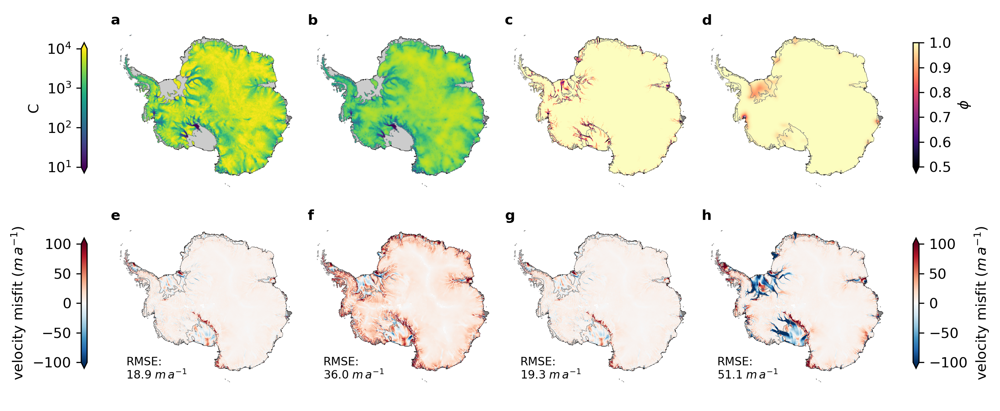

In [163]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import geopandas as gpd

kw = dict(central_latitude=-90, central_longitude=0, true_scale_latitude=-70)
proj = ccrs.Stereographic(**kw)

gdf = gpd.read_file('/Users/jonniebarnsley/Downloads/add_coastline_medium_res_line_v7_12.shp/add_coastline_medium_res_line_v7_12.shp')
outer = gdf[gdf.surface.isin([#'ice coastline', 'rock coastline',
                              'ice shelf and front'])]
add_crs = ccrs.SouthPolarStereo(true_scale_latitude=-71)

thkmask = thk.coarsen(x=8, y=8, boundary="trim").max() > 0

# --- layout parameters (spacing controlled here, independent of figsize) ---
nrows, ncols = 2, 4
wspace, hspace = 0, 0   # gaps as fraction of panel size
panel = 2.5                   # inches per (square) panel

# figsize matched to the grid aspect so no letterboxing occurs
figw = panel * ncols * (1 + wspace)
figh = panel * nrows * (1 + hspace)

fig, axes = plt.subplots(nrows, ncols, figsize=(figw, figh),
                         subplot_kw={"projection": proj}, dpi=300)
axes = axes.flatten()

# for ax in axes:
#     rgb_da.plot.imshow(ax=ax, x='x', y='y', alpha=0.2, rasterized=True)

# --- row 1, left pair: C ---
for ax, name in zip(axes[:2], ["loC", "hiC"]):
    field = var2d[name]
    x = field.x - field.x.mean()
    y = field.y - field.y.mean()
    ax.pcolormesh(x, y, thkmask, transform=proj, cmap="Greys", alpha=0.2, rasterized=True)
    im_C = ax.pcolormesh(x, y, field, transform=proj, rasterized=True,
                         norm=LogNorm(vmin=1e1, vmax=1e4), cmap="viridis")
    
    

# --- row 1, right pair: phi ---
for ax, name in zip(axes[2:4], ["loPhi", "hiPhi"]):
    field = var2d[name]
    im_phi = ax.pcolormesh(x, y, field, transform=proj, rasterized=True,
                           vmin=0.5, vmax=1, cmap="magma")

# --- row 2: misfit ---
for ax, field in zip(axes[4:], misfit2d.values()):
    x = field.x
    y = field.y
    im_misfit = ax.pcolormesh(x, y, field, transform=proj, rasterized=True,
                              cmap="RdBu_r", vmin=-100, vmax=100)
    rmse = np.sqrt(np.mean(field**2))
    ax.text(0.1, 0.1, f"RMSE:\n{rmse:.1f} $m\,a^{{-1}}$", transform=ax.transAxes,
            fontsize=8, va="bottom", ha="left", color="black")

for ax in axes:
    ax.set_aspect("equal")
    ax.coastlines(linewidth=0.3, color="grey")
    ax.set_axis_off()
    ax.add_geometries(outer.geometry, crs=add_crs, edgecolor='k',
                  facecolor='grey', linewidth=0.2, zorder=102)
    

# --- finalize layout BEFORE placing colorbars ---
fig.subplots_adjust(wspace=wspace, hspace=hspace)
fig.draw_without_rendering()   # applies aspect, finalizes axes positions

def add_cax(ax, side="right", size=0.03, pad=0.1):
    """Colorbar axes anchored to ax; size/pad as fractions of axes width."""
    pos = ax.get_position()    # post-aspect position
    y0, h = pos.y0, pos.height
    w, p = size * pos.width, pad * pos.width
    x = pos.x1 + p if side == "right" else pos.x0 - p - w
    return fig.add_axes([x, y0 + h/6, w, h*2/3])

def left_cbar(im, ax, label, **kwargs):
    cbar = fig.colorbar(im, cax=add_cax(ax, "left"), label=label, **kwargs)
    cbar.ax.yaxis.set_label_position("left")
    cbar.ax.yaxis.set_ticks_position("left")
    return cbar

left_cbar(im_C, axes[0], "C", extend="both", ticks=[1e1, 1e2, 1e3, 1e4])
fig.colorbar(im_phi, cax=add_cax(axes[3], "right"), label=r"$\phi$", extend="min", ticks=np.arange(0.5, 1.1, 0.1))
left_cbar(im_misfit, axes[4], r"velocity misfit ($m\,a^{-1}$)", extend="both")
fig.colorbar(im_misfit, cax=add_cax(axes[7], "right"), label=r"velocity misfit ($m\,a^{-1}$)", extend="both")

for ax, letter in zip(axes, "abcdefgh"):
    ax.text(0.02, 0.98, letter, transform=ax.transAxes,
            fontsize=10, fontweight="bold", va="top", ha="left", color="black")

plt.savefig("papers/inversion_sensitivity/figures/initial_states.pdf", dpi=300, bbox_inches="tight")

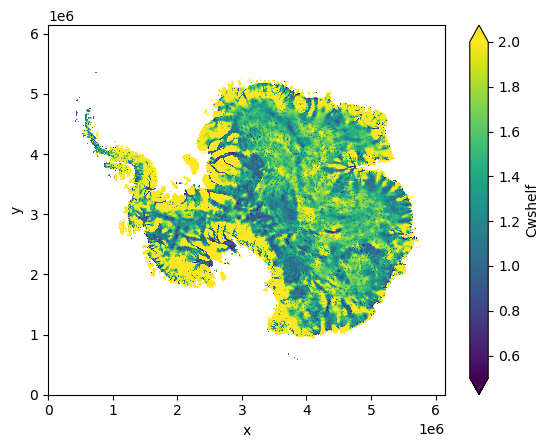

In [160]:
test = var2d["loC"] / var2d["hiC"]
test.plot(vmin=0.5, vmax=2)